# Initial SetUp

## Yolo Installation

In [1]:
!pip install super-gradients==3.1.0
!pip install imutils
!pip install pytube --upgrade

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 965.4/965.4 kB 19.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 887.5/887.5 MB 1.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.9/135.9 kB 17.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 684.5/684.5 kB 57.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 82.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 103.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 408.6/408.6 kB 45.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 94.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 22.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 11.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 98.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.5/13.5 MB 88.1 MB/s eta 0:

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.6/57.6 kB 3.0 MB/s eta 0:00:00


In [1]:
from super_gradients.training import models
from super_gradients.common.object_names import Models

[2023-06-28 13:53:51] INFO - crash_tips_setup.py - Crash tips is enabled. You can set your environment variable to CRASH_HANDLER=FALSE to disable it


The console stream is logged into /root/sg_logs/console.log


/usr/local/lib/python3.10/dist-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")
[2023-06-28 13:53:56] WARNING - __init__.py - Failed to import pytorch_quantization
[2023-06-28 13:53:56] WARNING - calibrator.py - Failed to import pytorch_quantization
[2023-06-28 13:53:56] WARNING - export.py - Failed to import pytorch_quantization
[2023-06-28 13:53:56] WARNING - selective_quantization_utils.py - Failed to import pytorch_quantization


In [2]:
from google.colab import drive
drive.mount('/content/drive')

## SAM Installation

In [3]:
# Install SAM
!pip install git+https://github.com/facebookresearch/segment-anything.git

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-bm7lkzg_
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-bm7lkzg_
  Resolved https://github.com/facebookresearch/segment-anything.git to commit 6fdee8f2727f4506cfbbe553e23b895e27956588
  Preparing metadata (setup.py) ... done
  Created wheel for segment-anything: filename=segment_anything-1.0-py3-none-any.whl size=36589 sha256=459ed0294a0685925f081523328a1fe076123197e201fdf4fc4b1599f83ebf49
  Stored in directory: /tmp/pip-ephem-wheel-cache-i377yn77/wheels/10/cf/59/9ccb2f0a1bcc81d4fbd0e501680b5d088d690c6cfbc02dc99d
Successfully built segment-anything


### Check for Cude

In [4]:
import torch
torch.__version__

'1.13.1+cu117'

In [5]:
torch.cuda.get_device_name(0)

'Tesla T4'

Helper Function

# Load Ip Image

In [6]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import cv2

In [7]:
image = cv2.imread('/content/drive/MyDrive/Colab_Notebooks/Computer Vision/SAM_SegmentAnything/input_images/test.jpeg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

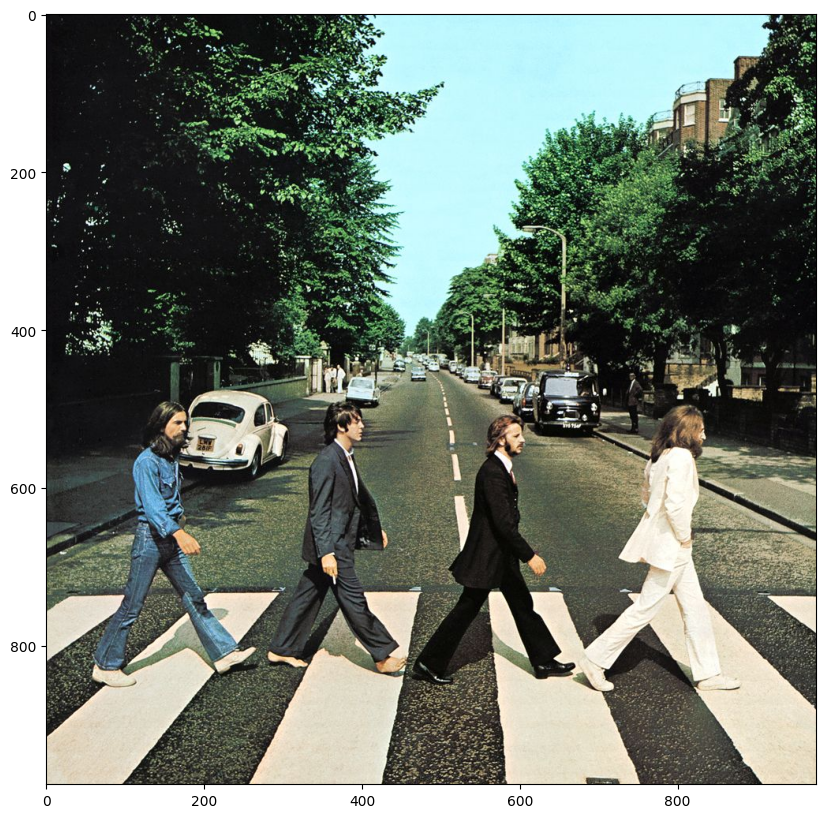

In [8]:
plt.figure(figsize=(10,10))

plt.imshow(image)

plt.axis('on')
plt.show()

# OD - YOLO_NAS

In [9]:
from super_gradients.training import models

yolo_nas_l = models.get("yolo_nas_l", pretrained_weights="coco")

[2023-06-28 13:54:15] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
Downloading: "https://sghub.deci.ai/models/yolo_nas_l_coco.pth" to /root/.cache/torch/hub/checkpoints/yolo_nas_l_coco.pth


  0%|          | 0.00/256M [00:00<?, ?B/s]

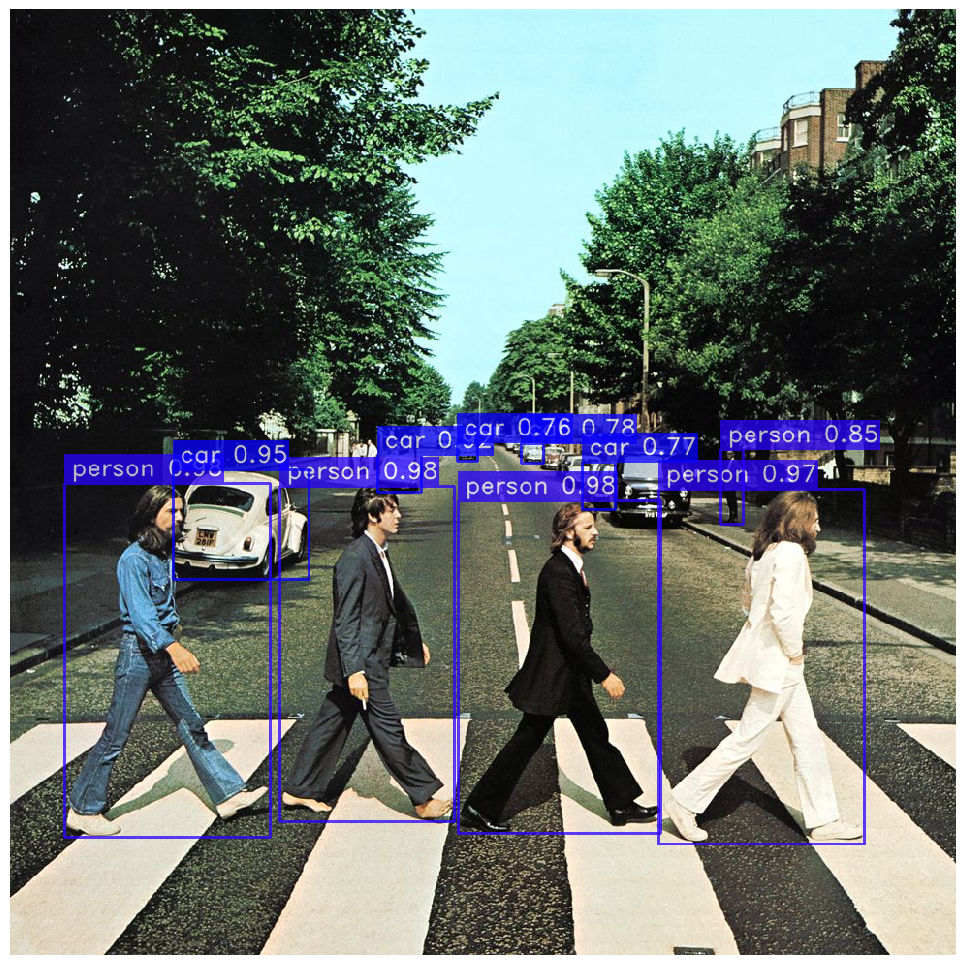

In [10]:
yolo_nas_l.predict(image, conf=0.75).show()

## Save to output folder

In [11]:
conf_threshold = 0.75
detection_pred = yolo_nas_l.predict(image, conf = conf_threshold)
detection = detection_pred.save('/content/drive/MyDrive/Colab_Notebooks/Computer Vision/SAM_SegmentAnything/output')

## Analyze NAS Prediction

In [12]:
pred = list(yolo_nas_l.predict(image, conf = conf_threshold)._images_prediction_lst)

In [13]:
pred

[ImageDetectionPrediction(image=array([[[ 15,  15,  17],
         [ 16,  16,  18],
         [ 15,  15,  17],
         ...,
         [ 66,  94,  69],
         [ 85, 120,  87],
         [ 52,  90,  53]],
 
        [[ 14,  14,  16],
         [ 16,  16,  18],
         [ 14,  14,  16],
         ...,
         [ 88, 118,  90],
         [110, 145, 112],
         [ 78, 116,  79]],
 
        [[ 14,  14,  16],
         [ 15,  15,  17],
         [ 14,  14,  16],
         ...,
         [ 71, 104,  75],
         [ 72, 109,  75],
         [ 66, 107,  67]],
 
        ...,
 
        [[219, 211, 190],
         [219, 211, 190],
         [219, 211, 190],
         ...,
         [219, 208, 180],
         [224, 213, 185],
         [229, 218, 190]],
 
        [[222, 214, 193],
         [219, 211, 190],
         [218, 210, 189],
         ...,
         [220, 209, 181],
         [224, 213, 185],
         [229, 218, 190]],
 
        [[225, 217, 196],
         [221, 213, 192],
         [217, 209, 188],
         ..

In [14]:
pred[0]

ImageDetectionPrediction(image=array([[[ 15,  15,  17],
        [ 16,  16,  18],
        [ 15,  15,  17],
        ...,
        [ 66,  94,  69],
        [ 85, 120,  87],
        [ 52,  90,  53]],

       [[ 14,  14,  16],
        [ 16,  16,  18],
        [ 14,  14,  16],
        ...,
        [ 88, 118,  90],
        [110, 145, 112],
        [ 78, 116,  79]],

       [[ 14,  14,  16],
        [ 15,  15,  17],
        [ 14,  14,  16],
        ...,
        [ 71, 104,  75],
        [ 72, 109,  75],
        [ 66, 107,  67]],

       ...,

       [[219, 211, 190],
        [219, 211, 190],
        [219, 211, 190],
        ...,
        [219, 208, 180],
        [224, 213, 185],
        [229, 218, 190]],

       [[222, 214, 193],
        [219, 211, 190],
        [218, 210, 189],
        ...,
        [220, 209, 181],
        [224, 213, 185],
        [229, 218, 190]],

       [[225, 217, 196],
        [221, 213, 192],
        [217, 209, 188],
        ...,
        [231, 220, 192],
        [233, 222,

In [15]:
pred[0].__dict__.keys()

dict_keys(['image', 'prediction', 'class_names'])

In [16]:
pred[0].prediction

DetectionPrediction(bboxes_xyxy=array([[462.8327  , 507.5756  , 671.809   , 850.35223 ],
       [ 56.867683, 489.5893  , 268.59116 , 854.3124  ],
       [278.931   , 492.3653  , 458.76447 , 838.0672  ],
       [669.566   , 495.77173 , 881.3265  , 861.77905 ],
       [168.21707 , 475.82718 , 308.70975 , 588.96173 ],
       [379.53812 , 460.11356 , 424.31686 , 498.95743 ],
       [733.09125 , 454.05203 , 756.6601  , 531.0896  ],
       [527.51636 , 448.70926 , 550.77057 , 468.04825 ],
       [590.1622  , 467.08795 , 624.61505 , 516.3058  ],
       [461.48737 , 447.57574 , 482.36288 , 466.58826 ]], dtype=float32), confidence=array([0.9820203 , 0.97971207, 0.9780668 , 0.9681691 , 0.9485164 ,
       0.9169066 , 0.85347867, 0.7807163 , 0.765674  , 0.763939  ],
      dtype=float32), labels=array([0., 0., 0., 0., 2., 2., 0., 2., 2., 2.], dtype=float32))

In [17]:
pred[0].prediction.__dict__.keys()

dict_keys(['bboxes_xyxy', 'confidence', 'labels'])

In [18]:
pred[0].prediction.bboxes_xyxy

array([[462.8327  , 507.5756  , 671.809   , 850.35223 ],
       [ 56.867683, 489.5893  , 268.59116 , 854.3124  ],
       [278.931   , 492.3653  , 458.76447 , 838.0672  ],
       [669.566   , 495.77173 , 881.3265  , 861.77905 ],
       [168.21707 , 475.82718 , 308.70975 , 588.96173 ],
       [379.53812 , 460.11356 , 424.31686 , 498.95743 ],
       [733.09125 , 454.05203 , 756.6601  , 531.0896  ],
       [527.51636 , 448.70926 , 550.77057 , 468.04825 ],
       [590.1622  , 467.08795 , 624.61505 , 516.3058  ],
       [461.48737 , 447.57574 , 482.36288 , 466.58826 ]], dtype=float32)

In [19]:
pred[0].prediction.bboxes_xyxy.shape

(10, 4)

In [20]:
pred[0].prediction.labels

array([0., 0., 0., 0., 2., 2., 0., 2., 2., 2.], dtype=float32)

In [21]:
pred[0].prediction.confidence

array([0.9820203 , 0.97971207, 0.9780668 , 0.9681691 , 0.9485164 ,
       0.9169066 , 0.85347867, 0.7807163 , 0.765674  , 0.763939  ],
      dtype=float32)

# SAM

### SAM SETUP

In [22]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import cv2

In [23]:
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)

def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))

# Automatic mask generation
def show_anns(anns):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:,:,3] = 0
    for ann in sorted_anns:
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.35]])
        img[m] = color_mask
    ax.imshow(img)

In [24]:
from segment_anything import sam_model_registry, SamPredictor
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor

sam_checkpoint = "/content/drive/MyDrive/Colab_Notebooks/Computer Vision/SAM_SegmentAnything/weights/sam_vit_h_4b8939.pth"
model_type = "vit_h"

device = "cuda"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

predictor = SamPredictor(sam)
mask_generator = SamAutomaticMaskGenerator(sam)


In [25]:
#Image Embedding
predictor.set_image(image)

# Auto mask
masks = mask_generator.generate(image)

### Bouding Box

In [26]:
# input_box = np.array([420, 500, 500, 800]) # box coordinates


# bb_masks, bb_scores, bb_logits = predictor.predict(
#     point_coords=None,
#     point_labels=None,
#     # Box ip
#     box=input_box[None, :],
#     multimask_output=False,
# )

In [27]:
# plt.figure(figsize=(10, 10))
# plt.imshow(image)

# show_mask(bb_masks[0], plt.gca())
# show_box(input_box, plt.gca())

# plt.title(f"Score: {bb_scores[0]:.3f}", fontsize=18)
# plt.axis('off')
# plt.show()

## Automask

In [28]:
masks

[{'segmentation': array([[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]]),
  'area': 88703,
  'bbox': [417, 0, 495, 402],
  'predicted_iou': 1.0403919219970703,
  'point_coords': [[533.75, 320.25]],
  'stability_score': 0.9803647994995117,
  'crop_box': [0, 0, 976, 976]},
 {'segmentation': array([[ True,  True,  True, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]]),
  'area': 186171,
  'bbox': [0, 0, 496, 43

In [29]:
len(masks)

114

In [30]:
masks[0].keys()

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])

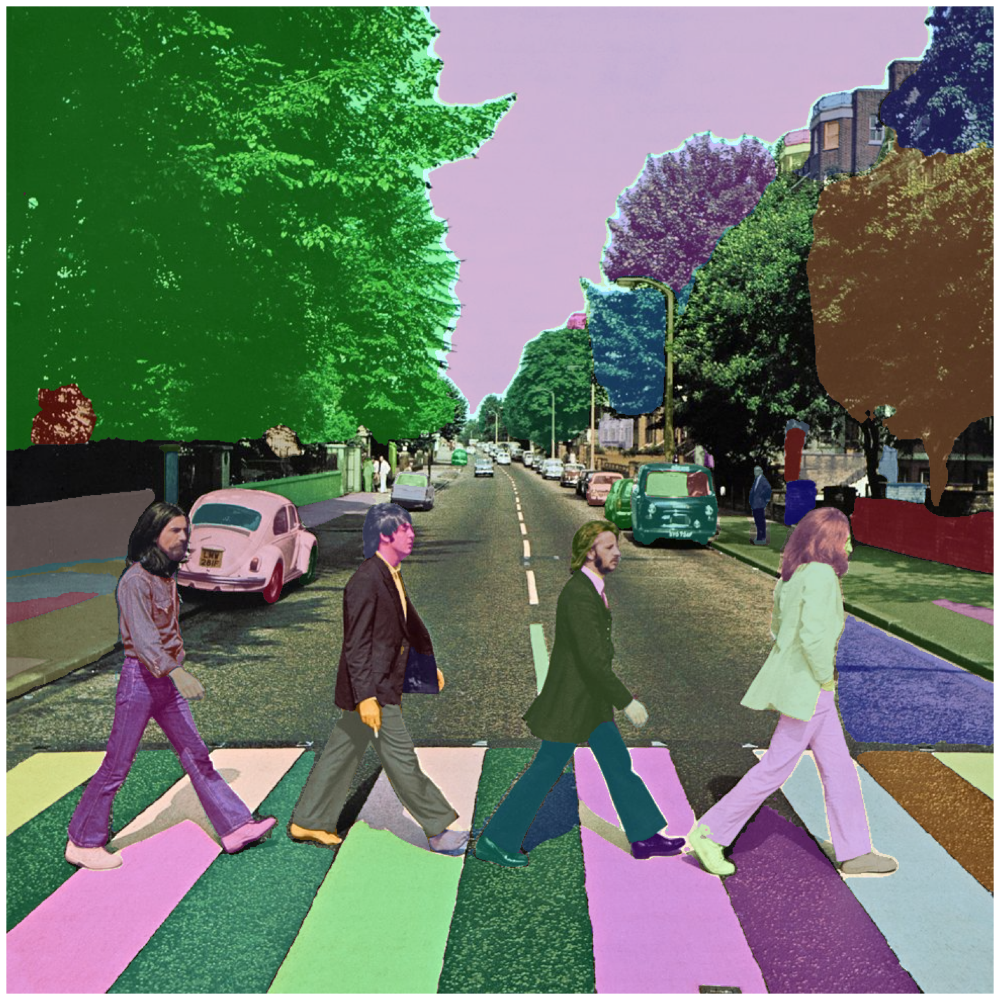

In [31]:
plt.figure(figsize=(20,20))
plt.imshow(image)

show_anns(masks)

plt.axis('off')
plt.show()

# YOLO_NAS + SAM = For segmenting and detecting specific class

Steps:
1. Object detection using NAS.
2.Provide Bounding Box Coordinates to SAM.
3. SAM provides mask.


## NAS

In [32]:
from super_gradients.training import models

model_nas = models.get("yolo_nas_l", pretrained_weights="coco")
conf_threshold = 0.25


[2023-06-28 13:55:36] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.


In [33]:
model_pred = list(model_nas.predict(image, conf = conf_threshold)._images_prediction_lst)

### Analyze

In [34]:
model_pred[0].__dict__.keys()

dict_keys(['image', 'prediction', 'class_names'])

In [35]:
model_pred[0].prediction.__dict__.keys()

dict_keys(['bboxes_xyxy', 'confidence', 'labels'])

## Get 'bboxes_xyxy', 'confidence', 'labels'.

In [36]:
bboxes_xyxy = model_pred[0].prediction.bboxes_xyxy.tolist()
bboxes_xyxy

[[462.83270263671875, 507.5755920410156, 671.8090209960938, 850.3522338867188],
 [56.86768341064453, 489.58929443359375, 268.5911560058594, 854.3123779296875],
 [278.9309997558594,
  492.36529541015625,
  458.76446533203125,
  838.0671997070312],
 [669.5659790039062, 495.771728515625, 881.3264770507812, 861.779052734375],
 [168.21707153320312, 475.8271789550781, 308.7097473144531, 588.9617309570312],
 [379.5381164550781, 460.1135559082031, 424.3168640136719, 498.9574279785156],
 [733.0912475585938, 454.0520324707031, 756.6600952148438, 531.089599609375],
 [527.516357421875, 448.7092590332031, 550.7705688476562, 468.0482482910156],
 [590.1621704101562, 467.08795166015625, 624.6150512695312, 516.3057861328125],
 [461.48736572265625,
  447.57574462890625,
  482.3628845214844,
  466.5882568359375],
 [616.0902099609375, 452.02154541015625, 705.0045776367188, 535.0720825195312],
 [573.2367553710938, 461.48553466796875, 610.3642578125, 494.98583984375],
 [547.2256469726562, 451.490234375, 572

In [37]:
# Extract desired outputs
bboxes_xyxy = model_pred[0].prediction.bboxes_xyxy.tolist()
confidence = model_pred[0].prediction.confidence.tolist()
labels = model_pred[0].prediction.labels.tolist()

In [38]:
bboxes_xyxy

[[462.83270263671875, 507.5755920410156, 671.8090209960938, 850.3522338867188],
 [56.86768341064453, 489.58929443359375, 268.5911560058594, 854.3123779296875],
 [278.9309997558594,
  492.36529541015625,
  458.76446533203125,
  838.0671997070312],
 [669.5659790039062, 495.771728515625, 881.3264770507812, 861.779052734375],
 [168.21707153320312, 475.8271789550781, 308.7097473144531, 588.9617309570312],
 [379.5381164550781, 460.1135559082031, 424.3168640136719, 498.9574279785156],
 [733.0912475585938, 454.0520324707031, 756.6600952148438, 531.089599609375],
 [527.516357421875, 448.7092590332031, 550.7705688476562, 468.0482482910156],
 [590.1621704101562, 467.08795166015625, 624.6150512695312, 516.3057861328125],
 [461.48736572265625,
  447.57574462890625,
  482.3628845214844,
  466.5882568359375],
 [616.0902099609375, 452.02154541015625, 705.0045776367188, 535.0720825195312],
 [573.2367553710938, 461.48553466796875, 610.3642578125, 494.98583984375],
 [547.2256469726562, 451.490234375, 572

In [39]:
confidence


[0.9820203185081482,
 0.9797120690345764,
 0.9780668020248413,
 0.968169093132019,
 0.9485164284706116,
 0.9169065952301025,
 0.8534786701202393,
 0.7807163000106812,
 0.7656739950180054,
 0.7639390230178833,
 0.6917731761932373,
 0.659017026424408,
 0.5759913325309753,
 0.5322226881980896,
 0.5042703747749329,
 0.4315200746059418,
 0.3725196123123169,
 0.36993324756622314,
 0.36437225341796875,
 0.35146453976631165,
 0.3423527479171753,
 0.33937227725982666,
 0.3151647448539734,
 0.3027496933937073,
 0.3015938401222229,
 0.28803250193595886,
 0.2688751220703125]

In [40]:
labels

[0.0,
 0.0,
 0.0,
 0.0,
 2.0,
 2.0,
 0.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 0.0,
 2.0,
 2.0,
 0.0,
 27.0,
 7.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0]

## SAM

In [41]:
sam_checkpoint = "/content/drive/MyDrive/Colab_Notebooks/Computer Vision/SAM_SegmentAnything/weights/sam_vit_h_4b8939.pth"
model_type = "vit_h"

device = "cuda"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

predictor = SamPredictor(sam)
masks = mask_generator.generate(image)

In [42]:
predictor.set_image(image)

### List to Tensor object

In [43]:
tensor_box = torch.tensor(bboxes_xyxy, device=predictor.device)

In [44]:
tensor_box

tensor([[462.8327, 507.5756, 671.8090, 850.3522],
        [ 56.8677, 489.5893, 268.5912, 854.3124],
        [278.9310, 492.3653, 458.7645, 838.0672],
        [669.5660, 495.7717, 881.3265, 861.7791],
        [168.2171, 475.8272, 308.7097, 588.9617],
        [379.5381, 460.1136, 424.3169, 498.9574],
        [733.0912, 454.0520, 756.6601, 531.0896],
        [527.5164, 448.7093, 550.7706, 468.0482],
        [590.1622, 467.0880, 624.6151, 516.3058],
        [461.4874, 447.5757, 482.3629, 466.5883],
        [616.0902, 452.0215, 705.0046, 535.0721],
        [573.2368, 461.4855, 610.3643, 494.9858],
        [547.2256, 451.4902, 572.2769, 475.6017],
        [438.7137, 438.8766, 455.9514, 454.3934],
        [366.9604, 443.6497, 379.7654, 480.0072],
        [481.5218, 440.3981, 498.3700, 453.0854],
        [478.2882, 438.4720, 497.3742, 453.4351],
        [351.2972, 446.4931, 364.9076, 480.8127],
        [379.4265, 555.0085, 398.7339, 625.5873],
        [616.0270, 451.8561, 704.8505, 535.3083],


In [45]:
transformed_boxes = predictor.transform.apply_boxes_torch(tensor_box, image.shape[:2])

In [46]:
transformed_boxes

tensor([[485.5949, 532.5383, 704.8488, 892.1728],
        [ 59.6645, 513.6674, 281.8005, 896.3277],
        [292.6489, 516.5800, 481.3266, 879.2836],
        [702.4954, 520.1539, 924.6703, 904.1616],
        [176.4900, 499.2285, 323.8922, 617.9270],
        [398.2039, 482.7421, 445.1849, 523.4963],
        [769.1449, 476.3824, 793.8729, 557.2087],
        [553.4598, 470.7769, 577.8576, 491.0670],
        [619.1865, 490.0594, 655.3338, 541.6978],
        [484.1834, 469.5876, 506.0856, 489.5352],
        [646.3897, 474.2521, 739.6769, 561.3871],
        [601.4287, 484.1815, 640.3821, 519.3294],
        [574.1384, 473.6946, 600.4216, 498.9920],
        [460.2898, 460.4607, 478.3752, 476.7406],
        [385.0077, 465.4685, 398.4424, 503.6140],
        [505.2032, 462.0570, 522.8799, 475.3683],
        [501.8105, 460.0361, 521.8351, 475.7351],
        [368.5741, 468.4518, 382.8538, 504.4592],
        [398.0868, 582.3040, 418.3437, 656.3538],
        [646.3234, 474.0785, 739.5153, 561.6349],


In [47]:
batch_masks, batch_scores, batch_logits = predictor.predict_torch(
    point_coords=None,
    point_labels=None,
    boxes=transformed_boxes,
    multimask_output=False,
)

In [48]:
batch_masks.shape # (batch_size) x (num_predicted_masks_per_input) x H x W

torch.Size([27, 1, 976, 976])

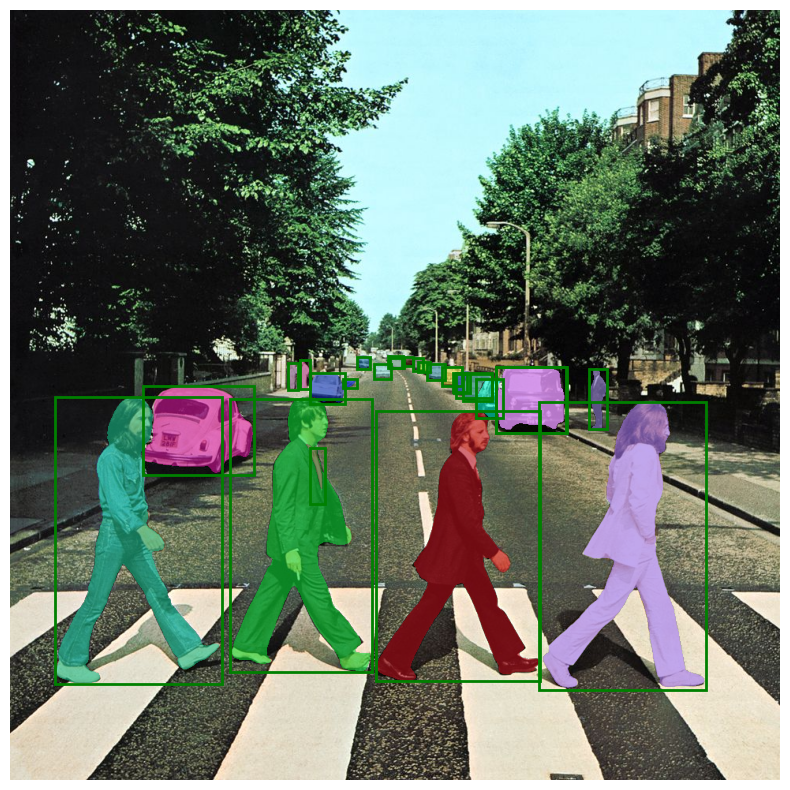

In [53]:
plt.figure(figsize=(10, 10))
plt.imshow(image)

for mask in batch_masks:
    show_mask(mask.cpu().numpy(), plt.gca(), random_color=True)

for box in tensor_box:
    show_box(box.cpu().numpy(), plt.gca())

plt.axis('off')
plt.savefig('my_image.jpg')
plt.show()
